## CLASIFICACION DE VEHICULOS

## Verificacion de entorno de ejecucion

In [ ]:
!nvidia-smi

Thu May 30 14:47:54 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Instalacion / Importacion de dependencias

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.0/201.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


## Entrenamiento del modelo con nuestro dataset

In [ ]:

# Crear y entrenar el modelo
model = YOLO('yolov8n.pt')  # Cambia a 'yolov8s.pt', 'yolov8m.pt', etc., según la versión que quieras usar
result_train = model.train(data='/content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/data.yaml', epochs=40, imgsz=640)


100%|██████████| 6.23M/6.23M [00:00<00:00, 389MB/s]
New https://pypi.org/project/ultralytics/8.2.27 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/data.yaml, epochs=40, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

Muestro las metricas



In [ ]:
print(result_train)

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7950a6c2a8f0>
fitness: 0.8229040749348949
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.78261,     0.72446,     0.83738,     0.88761,     0.83179,     0.77396])
names: {0: 'bicicleta', 1: 'moto', 2: 'colectivo', 3: 'camion', 4: 'camioneta', 5: 'auto'}
plot: True
results_dict: {'metrics/precision(B)': 0.9217299291660513, 'metrics/recall(B)': 0.9123178569538206, 'metrics/mAP50(B)': 0.972295910881024, 'metrics/mAP50-95(B)': 0.8063049820519917, 'fitness': 0.8229040749348949}
save_dir: PosixPath('runs/detect/train')
speed: {'preprocess': 0.31282983977219153, 'inference': 2.488966645865605, 'loss': 0.0009290103254647091, 'postprocess': 3.195536547693713}


In [ ]:
# Asumimos que 'result_train' es tu objeto DetMetrics
print("Métricas de Entrenamiento:")

# Accede directamente a los atributos del objeto
print(f"Precision: {result_train.results_dict['metrics/precision(B)']}")
print(f"Recall: {result_train.results_dict['metrics/recall(B)']}")
print(f"mAP50: {result_train.results_dict['metrics/mAP50(B)']}")
print(f"mAP50-95: {result_train.results_dict['metrics/mAP50-95(B)']}")
print(f"Fitness: {result_train.fitness}")

# Accede a las métricas por clase
print("Class Metrics:")
for idx, class_name in result_train.names.items():
    print(f"  {class_name}:")
    print(f"    Precision: {result_train.box.p[idx]}")
    print(f"    Recall: {result_train.box.r[idx]}")
    print(f"    mAP50: {result_train.box.all_ap[idx][0]}")  # Asumiendo que el primer valor es para IoU 0.5
    print(f"    mAP50-95: {result_train.box.all_ap[idx][5]}")  # Asumiendo que el sexto valor es para IoU 0.5:0.95

# Accede a las velocidades de procesamiento
print("Speed Metrics:")
print(f"  Preprocess: {result_train.speed['preprocess']} ms")
print(f"  Inference: {result_train.speed['inference']} ms")
print(f"  Postprocess: {result_train.speed['postprocess']} ms")


Métricas de Entrenamiento:
Precision: 0.9217299291660513
Recall: 0.9123178569538206
mAP50: 0.972295910881024
mAP50-95: 0.8063049820519917
Fitness: 0.8229040749348949
Class Metrics:
  bicicleta:
    Precision: 0.9738822670170724
    Recall: 1.0
    mAP50: 0.995
    mAP50-95: 0.995
  moto:
    Precision: 0.9523471474533176
    Recall: 0.8888888888888888
    mAP50: 0.984
    mAP50-95: 0.984
  colectivo:
    Precision: 0.9171864009275994
    Recall: 1.0
    mAP50: 0.995
    mAP50-95: 0.995
  camion:
    Precision: 0.9530855551527386
    Recall: 1.0
    mAP50: 0.995
    mAP50-95: 0.995
  camioneta:
    Precision: 0.7338782044455803
    Recall: 0.9193910222279017
    mAP50: 0.9196853146853149
    mAP50-95: 0.9196853146853149
  auto:
    Precision: 1.0
    Recall: 0.6656272306061335
    mAP50: 0.9450901506008292
    mAP50-95: 0.9450901506008292
Speed Metrics:
  Preprocess: 0.31282983977219153 ms
  Inference: 2.488966645865605 ms
  Postprocess: 3.195536547693713 ms


Se observan resultados mas que aceptables, con una precision general de 0.92 y un Recall de 0.91

Matriz de confusion

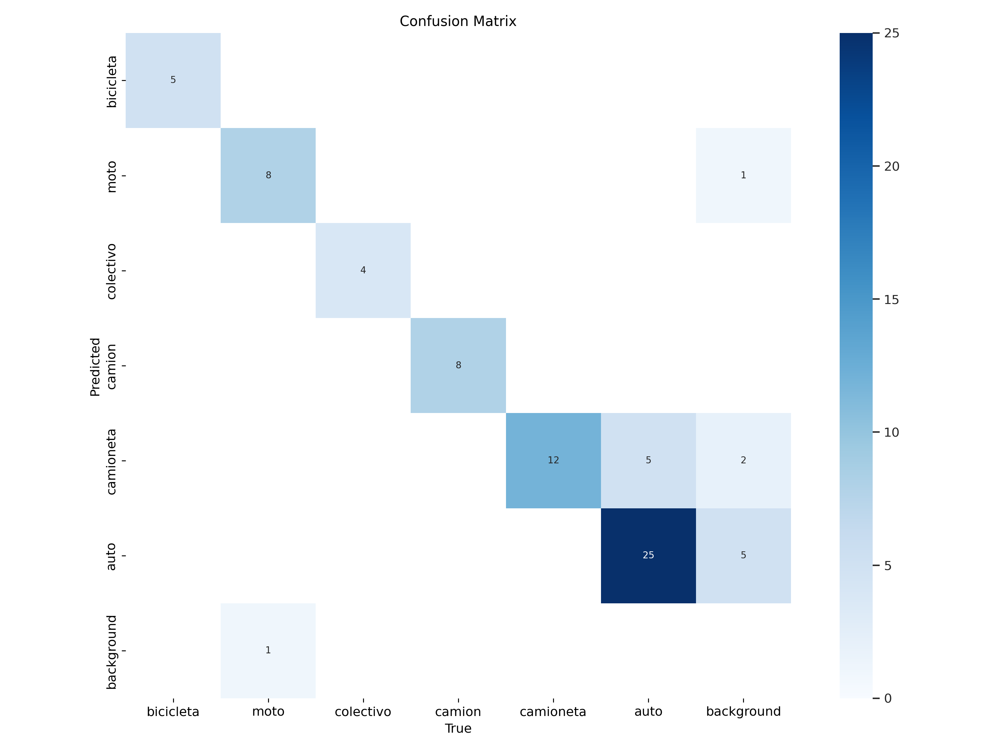

In [ ]:
Image(filename=f'runs/detect/train/confusion_matrix.png', width=900)

Observamos buenos resultados en general, alguna confusion con autos y camionetas. Lo cual esta dentro de lo normal

/content


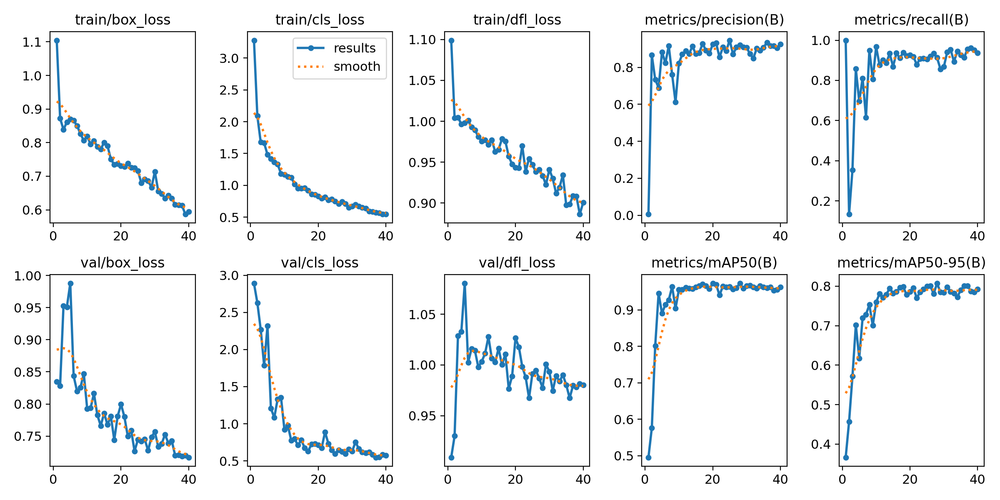

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=900)

/content


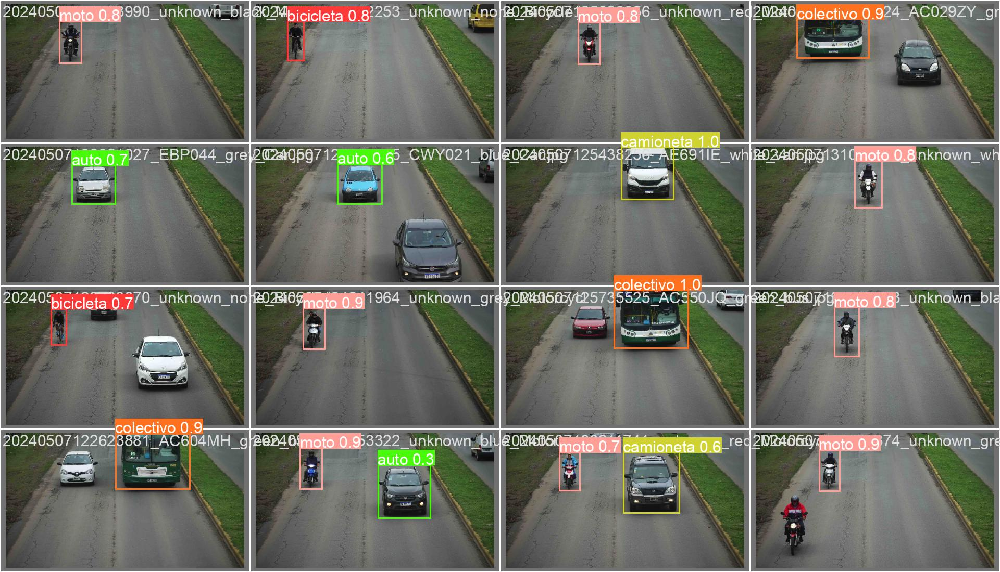

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=900)

Validacion del modelo

In [ ]:
%cd {HOME}
ruta = "/content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/data.yaml"
# Paso 3: Validar el modelo
results_validacion = model.val(data=ruta, imgsz=640)



Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


/content


Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/validate/labels.cache... 58 images, 0 backgrounds, 0 corrupt: 100%|██████████| 58/58 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/validate/images/20240507122053990_unknown_black_Motorcycle.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/validate/images/20240507122351027_EBP044_grey_Car.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/validate/images/20240507122623881_AC604MH_green_bus.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/validate/images/20240507122712253_unknown_none_Bicycle.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/drive/MyDrive/IA-ANALISIS-DE-TRA

In [ ]:
print(results_validacion)

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7950a9b15f00>
fitness: 0.8239810692440507
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.78819,     0.72446,     0.83738,      0.8876,     0.83177,      0.7756])
names: {0: 'bicicleta', 1: 'moto', 2: 'colectivo', 3: 'camion', 4: 'camioneta', 5: 'auto'}
plot: True
results_dict: {'metrics/precision(B)': 0.921588007236096, 'metrics/recall(B)': 0.9128794297094016, 'metrics/mAP50(B)': 0.972295910881024, 'metrics/mAP50-95(B)': 0.8075016423954982, 'fitness': 0.8239810692440507}
save_dir: PosixPath('runs/detect/val')
speed: {'preprocess': 0.15914440155029297, 'inference': 10.230068502755001, 'loss': 0.0017593646871632543, 'postprocess': 2.63534743210365}


In [ ]:
print("Métricas de validacion:")

# Accede directamente a los atributos del objeto
print(f"Precision: {results_validacion.results_dict['metrics/precision(B)']}")
print(f"Recall: {results_validacion.results_dict['metrics/recall(B)']}")
print(f"mAP50: {results_validacion.results_dict['metrics/mAP50(B)']}")
print(f"mAP50-95: {results_validacion.results_dict['metrics/mAP50-95(B)']}")
print(f"Fitness: {results_validacion.fitness}")

# Accede a las métricas por clase
print("Class Metrics:")
for idx, class_name in results_validacion.names.items():
    print(f"  {class_name}:")
    print(f"    Precision: {results_validacion.box.p[idx]}")
    print(f"    Recall: {results_validacion.box.r[idx]}")
    print(f"    mAP50: {results_validacion.box.all_ap[idx][0]}")  # Asumiendo que el primer valor es para IoU 0.5
    print(f"    mAP50-95: {results_validacion.box.all_ap[idx][5]}")  # Asumiendo que el sexto valor es para IoU 0.5:0.95

# Accede a las velocidades de procesamiento
print("Speed Metrics:")
print(f"  Preprocess: {results_validacion.speed['preprocess']} ms")
print(f"  Inference: {results_validacion.speed['inference']} ms")
print(f"  Postprocess: {results_validacion.speed['postprocess']} ms")

Métricas de validacion:
Precision: 0.921588007236096
Recall: 0.9128794297094016
mAP50: 0.972295910881024
mAP50-95: 0.8075016423954982
Fitness: 0.8239810692440507
Class Metrics:
  bicicleta:
    Precision: 0.9735972124438769
    Recall: 1.0
    mAP50: 0.995
    mAP50-95: 0.995
  moto:
    Precision: 0.9518215931633578
    Recall: 0.8888888888888888
    mAP50: 0.984
    mAP50-95: 0.984
  colectivo:
    Precision: 0.9167108033141148
    Recall: 1.0
    mAP50: 0.995
    mAP50-95: 0.995
  camion:
    Precision: 0.9529219913280712
    Recall: 1.0
    mAP50: 0.995
    mAP50-95: 0.995
  camioneta:
    Precision: 0.7344764431671555
    Recall: 0.9223822158357778
    mAP50: 0.9196853146853149
    mAP50-95: 0.9196853146853149
  auto:
    Precision: 1.0
    Recall: 0.6660054735317431
    mAP50: 0.9450901506008292
    mAP50-95: 0.9450901506008292
Speed Metrics:
  Preprocess: 0.15914440155029297 ms
  Inference: 10.230068502755001 ms
  Postprocess: 2.63534743210365 ms


Se observan resultados similares a los del entrenamiento


## Inferencia sobre el dataset de test

In [ ]:
test_data_path = '/content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images'

# Realizar predicciones en el conjunto de datos de prueba especificado en el archivo YAML
resultado_test = model.predict(data=test_data_path, source= test_data_path, save=True, save_txt=True, save_conf=True)
# Opcional: Imprimir los resultados
#print(resultado_test)




image 1/112 /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507121443045_GKL892_white_Car.jpg: 384x640 1 camioneta, 22.5ms
image 2/112 /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507121450434_AG170KO_blue_truck.jpg: 384x640 1 camion, 35.1ms
image 3/112 /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507121619486_OWV963_white_van.jpg: 384x640 1 camioneta, 9.5ms
image 4/112 /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507121800673_unknown_black_Motorcycle.jpg: 384x640 1 moto, 13.7ms
image 5/112 /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507122027825_unknown_red_Motorcycle.jpg: 384x640 1 moto, 9.6ms
image 6/112 /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507122410387_unknown_red_Motorcycle.jpg: 384x640 1 moto, 9.8ms
image 7/112 /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehi

In [ ]:
print("Resultados de Predicción:")

for i, result in enumerate(resultado_test):
    print(f"Resultado para la imagen {i+1}:")
    # Accede a los atributos del resultado individual
    print(f"  Nombre de archivo: {result.path}")
    print(f"  Número de predicciones: {len(result.boxes)}")

    for box in result.boxes:
        # Convierte el tensor a un valor escalar antes de usarlo como índice
        clase_idx = int(box.cls.item())
        print(f"    Clase: {result.names[clase_idx]}")
        print(f"    Confianza: {box.conf.item()}")
        print(f"    Coordenadas: {box.xyxy.tolist()}")  # Convierte las coordenadas a una lista


Resultados de Predicción:
Resultado para la imagen 1:
  Nombre de archivo: /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507121443045_GKL892_white_Car.jpg
  Número de predicciones: 1
    Clase: camioneta
    Confianza: 0.86842942237854
    Coordenadas: [[1438.45068359375, 134.49574279785156, 1968.813232421875, 676.7503662109375]]
Resultado para la imagen 2:
  Nombre de archivo: /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507121450434_AG170KO_blue_truck.jpg
  Número de predicciones: 1
    Clase: camion
    Confianza: 0.9360139966011047
    Coordenadas: [[1249.630126953125, 3.0670714378356934, 2021.88720703125, 617.8397216796875]]
Resultado para la imagen 3:
  Nombre de archivo: /content/drive/MyDrive/IA-ANALISIS-DE-TRAFICO/vehiculos_dataset/test/images/20240507121619486_OWV963_white_van.jpg
  Número de predicciones: 1
    Clase: camioneta
    Confianza: 0.9666269421577454
    Coordenadas: [[1252.73193359375, 64.9113

Metricas de las predicciones sobre el dataset de test

In [ ]:
from collections import defaultdict

# Inicializar acumuladores para las métricas por clase y generales
class_metrics = defaultdict(lambda: {"confidences": [], "count": 0})
global_metrics = {"confidences": [], "count": 0}

# Iterar sobre los resultados de predicción
for result in resultado_test:
    for box in result.boxes:
        clase_idx = int(box.cls.item())
        class_name = result.names[clase_idx]
        confidence = box.conf.item()

        # Actualizar métricas por clase
        class_metrics[class_name]["confidences"].append(confidence)
        class_metrics[class_name]["count"] += 1

        # Actualizar métricas generales
        global_metrics["confidences"].append(confidence)
        global_metrics["count"] += 1

# Calcular métricas generales para cada clase
print("Métricas Generales por Clase:")
for class_name, metrics in class_metrics.items():
    confidences = metrics["confidences"]
    count = metrics["count"]

    avg_confidence = sum(confidences) / len(confidences) if confidences else 0

    print(f"Clase: {class_name}")
    print(f"  Número de Predicciones: {count}")
    print(f"  Confianza Promedio: {avg_confidence:.2f}")

# Calcular métricas generales para todas las categorías
global_confidences = global_metrics["confidences"]
global_count = global_metrics["count"]
global_avg_confidence = sum(global_confidences) / len(global_confidences) if global_confidences else 0

print("\nMétricas Generales (Todas las Categorías):")
print(f"  Número Total de Predicciones: {global_count}")
print(f"  Confianza Promedio Total: {global_avg_confidence:.2f}")


Métricas Generales por Clase:
Clase: camioneta
  Número de Predicciones: 56
  Confianza Promedio: 0.84
Clase: camion
  Número de Predicciones: 17
  Confianza Promedio: 0.89
Clase: moto
  Número de Predicciones: 27
  Confianza Promedio: 0.82
Clase: bicicleta
  Número de Predicciones: 8
  Confianza Promedio: 0.80
Clase: auto
  Número de Predicciones: 35
  Confianza Promedio: 0.67
Clase: colectivo
  Número de Predicciones: 4
  Confianza Promedio: 0.92

Métricas Generales (Todas las Categorías):
  Número Total de Predicciones: 147
  Confianza Promedio Total: 0.80


Muestro las imagenes con los vehiculos detectados

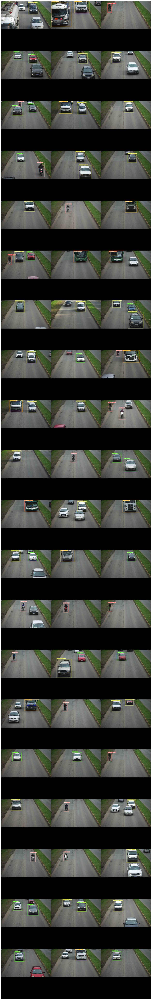

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np

# Ruta al directorio donde se guardaron las predicciones
save_dir = 'runs/detect/predict'

# Obtener la lista de imágenes guardadas, limitándola a 60 imágenes
predicted_images = [os.path.join(save_dir, img) for img in os.listdir(save_dir) if img.endswith(('.jpg', '.png', '.jpeg'))][:60]

# Parámetros para el collage
thumbnail_max_size = 500  # Tamaño máximo de cada imagen en el collage
num_columns = 3  # Número de columnas en el collage

# Redimensionar todas las imágenes manteniendo la proporción
resized_images = []
for img_path in predicted_images:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    scaling_factor = thumbnail_max_size / max(h, w)
    new_size = (int(w * scaling_factor), int(h * scaling_factor))
    img = cv2.resize(img, new_size)
    resized_images.append(img)

# Calcular el número de filas necesarias para el collage
num_rows = (len(resized_images) + num_columns - 1) // num_columns

# Calcular el tamaño del collage
collage_width = num_columns * thumbnail_max_size
collage_height = num_rows * thumbnail_max_size

# Crear una imagen en blanco para el collage
collage = np.zeros((collage_height, collage_width, 3), dtype=np.uint8)

# Añadir cada imagen redimensionada al collage
for idx, img in enumerate(resized_images):
    row = idx // num_columns
    col = idx % num_columns
    y_offset = row * thumbnail_max_size
    x_offset = col * thumbnail_max_size
    y_end = y_offset + img.shape[0]
    x_end = x_offset + img.shape[1]
    collage[y_offset:y_end, x_offset:x_end] = img

# Mostrar el collage con un tamaño de figura ajustado
fig_size = (num_columns * thumbnail_max_size / 100, num_rows * thumbnail_max_size / 100)
plt.figure(figsize=fig_size)
plt.imshow(collage)
plt.axis('off')
plt.show()


Pasaremos a extraer cada uno de los vehiculos detectados para obtener un nuevo dataset solo de recortes de vehiculos

In [ ]:
from PIL import Image
import os
from collections import defaultdict

# Directorio para guardar los recortes
output_dir = 'recortes'
os.makedirs(output_dir, exist_ok=True)

# Iterar sobre los resultados de predicción
for result in resultado_test:
    image_path = result.path
    image_name = os.path.basename(image_path)
    img = Image.open(image_path)

    # Contadores para cada clase de vehículo en una imagen
    vehicle_count = defaultdict(int)

    for box in result.boxes:
        clase_idx = int(box.cls.item())
        class_name = result.names[clase_idx]
        vehicle_count[class_name] += 1
        count = vehicle_count[class_name]

        # Coordenadas del bounding box
        x_min, y_min, x_max, y_max = [int(coord.item()) for coord in box.xyxy[0]]
        cropped_img = img.crop((x_min, y_min, x_max, y_max))

        # Nombre del archivo recortado
        cropped_img_name = f"{os.path.splitext(image_name)[0]}_{class_name}_{count}.jpg"
        cropped_img_path = os.path.join(output_dir, cropped_img_name)

        # Guardar la imagen recortada
        cropped_img.save(cropped_img_path)
        print(f"Guardado: {cropped_img_path}")


Guardado: recortes/20240507121443045_GKL892_white_Car_camioneta_1.jpg
Guardado: recortes/20240507121450434_AG170KO_blue_truck_camion_1.jpg
Guardado: recortes/20240507121619486_OWV963_white_van_camioneta_1.jpg
Guardado: recortes/20240507121800673_unknown_black_Motorcycle_moto_1.jpg
Guardado: recortes/20240507122027825_unknown_red_Motorcycle_moto_1.jpg
Guardado: recortes/20240507122410387_unknown_red_Motorcycle_moto_1.jpg
Guardado: recortes/20240507122912790_unknown_none_Bicycle_bicicleta_1.jpg
Guardado: recortes/20240507123139243_unknown_blue_Motorcycle_moto_1.jpg
Guardado: recortes/20240507123342607_unknown_white_Motorcycle_moto_1.jpg
Guardado: recortes/20240507123618831_unknown_black_Motorcycle_moto_1.jpg
Guardado: recortes/20240507123917051_LUU421_white_truck_camion_1.jpg
Guardado: recortes/20240507123917051_LUU421_white_truck_moto_1.jpg
Guardado: recortes/20240507124021584_unknown_none_Bicycle_bicicleta_1.jpg
Guardado: recortes/20240507124130635_AD646IS_white_van_camioneta_1.jpg
Gua

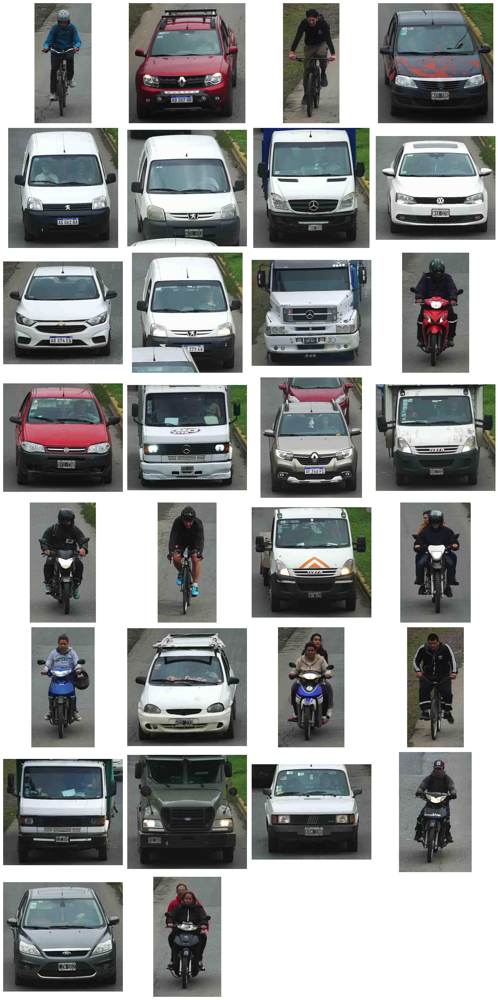

In [ ]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Directorio de recortes
output_dir = 'recortes'

# Obtener todas las rutas de las imágenes en el directorio de recortes
image_paths = [os.path.join(output_dir, fname) for fname in os.listdir(output_dir) if fname.endswith('.jpg')]

# Seleccionar solo las primeras 30 imágenes
image_paths = image_paths[:30]

# Mostrar el collage
def show_collage(image_paths, columns=4, image_size=(4, 4)):
    num_images = len(image_paths)
    rows = (num_images + columns - 1) // columns  # Redondear hacia arriba

    fig, axes = plt.subplots(rows, columns, figsize=(image_size[0]*columns, image_size[1]*rows))
    for ax, img_path in zip(axes.flat, image_paths):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')  # Ocultar ejes

    # Eliminar los ejes adicionales si el número de imágenes no es múltiplo de columnas
    for ax in axes.flat[num_images:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Mostrar el collage con 4 columnas
show_collage(image_paths, columns=4, image_size=(4, 4))
